# Statistical Analysis of Dengue Virus using Python
In this kernel, you'll learn to explore DNA and Protein sequence statistics by using Python, Biopython and Scikit-bio. 

## Table of Contents 
- Exploring Sequence 
- Reading and Cleaning Sequence 

- DNA Sequence Statistics 
    - Sequence Length 
    - Nucleotide Frequency
    - Nucleotide Percentage 
    - Plotting Nucleotide Frequency Distribution 
    - K-mer Analysis 
    - Plotting K-mer Frequency Distribution
    - Hamming Distance using Python
    - Hamming Distance using Scikit-bio 
    - Calculate GC Content 
    - Sliding Window Analysis of GC 
    - Calculate AT Content
    - Sliding Window Analysis of AT 
    - Dotplot: for DNA Sequence 
    - Nucleotide Density Plot 
    - Dimer Density Plot 
- Translation and Protein Sequence Statistics 
    - Load Sequence using Biopython 
    - Convert DNA Letter into Seq Object 
    - Translation 
    - Protein Length 
    - Protein Frequency 
    - Plotting Protein Frequency Distribution 
    - Dot Plot: for Protein Sequence 
    
- Sequence Alignment 
    - Local Alignment 
    - Global Alignment 
    - Alignment Printing 
    - Alignment Scores 
    - Smilarity Check 

## Load Packages 

In [2]:
# for sequence analysis 
from collections import Counter
import Bio 
from skbio import Sequence
from skbio.sequence.distance import hamming
from Bio import SeqIO
import pandas as pd
import numpy as np

# for data visualization
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

# set figuresize and fontsize
plt.rcParams['figure.figsize'] = (10,6)
plt.rcParams['font.size'] = 14


## Explore Sequence 
- `head`: to examine first few lines of sequence 
- `tail`: to examine last few lines of sequence 

In [4]:
# examine first few lines of den-1 
!head ../dengue/den1.fasta

>NC_001477.1 Dengue virus 1, complete genome
AGTTGTTAGTCTACGTGGACCGACAAGAACAGTTTCGAATCGGAAGCTTGCTTAACGTAGTTCTAACAGT
TTTTTATTAGAGAGCAGATCTCTGATGAACAACCAACGGAAAAAGACGGGTCGACCGTCTTTCAATATGC
TGAAACGCGCGAGAAACCGCGTGTCAACTGTTTCACAGTTGGCGAAGAGATTCTCAAAAGGATTGCTTTC
AGGCCAAGGACCCATGAAATTGGTGATGGCTTTTATAGCATTCCTAAGATTTCTAGCCATACCTCCAACA
GCAGGAATTTTGGCTAGATGGGGCTCATTCAAGAAGAATGGAGCGATCAAAGTGTTACGGGGTTTCAAGA
AAGAAATCTCAAACATGTTGAACATAATGAACAGGAGGAAAAGATCTGTGACCATGCTCCTCATGCTGCT
GCCCACAGCCCTGGCGTTCCATCTGACCACCCGAGGGGGAGAGCCGCACATGATAGTTAGCAAGCAGGAA
AGAGGAAAATCACTTTTGTTTAAGACCTCTGCAGGTGTCAACATGTGCACCCTTATTGCAATGGATTTGG
GAGAGTTATGTGAGGACACAATGACCTACAAATGCCCCCGGATCACTGAGACGGAACCAGATGACGTTGA


In [5]:
# examine last few lines of den-1 
!tail ../dengue/den1.fasta

ACCAACATACAAGTGGCCATAAACCAAGTGAGAAGGCTCATTGGGAATGAGAATTATCTAGACTTCATGA
CATCAATGAAGAGATTCAAAAACGAGAGTGATCCCGAAGGGGCACTCTGGTAAGCCAACTCATTCACAAA
ATAAAGGAAAATAAAAAATCAAACAAGGCAAGAAGTCAGGCCGGATTAAGCCATAGCACGGTAAGAGCTA
TGCTGCCTGTGAGCCCCGTCCAAGGACGTAAAATGAAGTCAGGCCGAAAGCCACGGTTCGAGCAAGCCGT
GCTGCCTGTAGCTCCATCGTGGGGATGTAAAAACCCGGGAGGCTGCAAACCATGGAAGCTGTACGCATGG
GGTAGCAGACTAGTGGTTAGAGGAGACCCCTCCCAAGACACAACGCAGCAGCGGGGCCCAACACCAGGGG
AAGCTGTACCCTGGTGGTAAGGACTAGAGGTTAGAGGAGACCCCCCGCACAACAACAAACAGCATATTGA
CGCTGGGAGAGACCAGAGATCCTGCTGTCTCTACAGCATCATTCCAGGCACAGAACGCCAAAAAATGGAA
TGGTGCTGTTGAATCAACAGGTTCT



In [6]:
# examine first few lines of den-2 
!head ../dengue/den2.fasta

>NC_001474.2 Dengue virus 2, complete genome
AGTTGTTAGTCTACGTGGACCGACAAAGACAGATTCTTTGAGGGAGCTAAGCTCAACGTAGTTCTAACAG
TTTTTTAATTAGAGAGCAGATCTCTGATGAATAACCAACGGAAAAAGGCGAAAAACACGCCTTTCAATAT
GCTGAAACGCGAGAGAAACCGCGTGTCGACTGTGCAACAGCTGACAAAGAGATTCTCACTTGGAATGCTG
CAGGGACGAGGACCATTAAAACTGTTCATGGCCCTGGTGGCGTTCCTTCGTTTCCTAACAATCCCACCAA
CAGCAGGGATATTGAAGAGATGGGGAACAATTAAAAAATCAAAAGCTATTAATGTTTTGAGAGGGTTCAG
GAAAGAGATTGGAAGGATGCTGAACATCTTGAATAGGAGACGCAGATCTGCAGGCATGATCATTATGCTG
ATTCCAACAGTGATGGCGTTCCATTTAACCACACGTAACGGAGAACCACACATGATCGTCAGCAGACAAG
AGAAAGGGAAAAGTCTTCTGTTTAAAACAGAGGATGGCGTGAACATGTGTACCCTCATGGCCATGGACCT
TGGTGAATTGTGTGAAGACACAATCACGTACAAGTGTCCCCTTCTCAGGCAGAATGAGCCAGAAGACATA


In [7]:
# examine last few lines of den-2 
!tail ../dengue/den2.fasta

AGAACATCCAAGCAGCAATAAATCAAGTTAGATCCCTTATAGGCAATGAAGAATACACAGATTACATGCC
ATCCATGAAAAGATTCAGAAGAGAAGAGGAAGAAGCAGGAGTTCTGTGGTAGAAAGCAAAACTAACATGA
AACAAGGCTAGAAGTCAGGTCGGATTAAGCCATAGTACGGAAAAAACTATGCTACCTGTGAGCCCCGTCC
AAGGACGTTAAAAGAAGTCAGGCCATCATAAATGCCATAGCTTGAGTAAACTATGCAGCCTGTAGCTCCA
CCTGAGAAGGTGTAAAAAATCCGGGAGGCCACAAACCATGGAAGCTGTACGCATGGCGTAGTGGACTAGC
GGTTAGAGGAGACCCCTCCCTTACAAATCGCAGCAACAATGGGGGCCCAAGGCGAGATGAAGCTGTAGTC
TCGCTGGAAGGACTAGAGGTTAGAGGAGACCCCCCCGAAACAAAAAACAGCATATTGACGCTGGGAAAGA
CCAGAGATCCTGCTGTCTCCTCAGCATCATTCCAGGCACAGAACGCCAGAAAATGGAATGGTGCTGTTGA
ATCAACAGGTTCT



In [8]:
# examine first few lines of den-3 
!head ../dengue/den3.fasta

>NC_001475.2 Dengue virus 3, complete genome
AGTTGTTAGTCTACGTGGACCGACAAGAACAGTTTCGACTCGGAAGCTTGCTTAACGTAGTGCTGACAGT
TTTTTATTAGAGAGCAGATCTCTGATGAACAACCAACGGAAGAAGACGGGAAAACCGTCTATCAATATGC
TGAAACGCGTGAGAAACCGTGTGTCAACTGGATCACAGTTGGCGAAGAGATTCTCAAAAGGACTGCTGAA
CGGCCAGGGACCAATGAAATTGGTTATGGCGTTCATAGCTTTCCTCAGATTTCTAGCCATTCCACCAACA
GCAGGAGTCTTGGCTAGATGGGGAACCTTCAAGAAGTCGGGGGCCATTAAGGTCCTGAAAGGCTTCAAGA
AGGAGATCTCAAACATGCTGAGCATAATCAACCAACGGAAAAAGACATCGCTCTGTCTCATGATGATATT
GCCAGCAGCACTTGCTTTCCACTTGACTTCACGAGATGGAGAGCCGCGCATGATTGTGGGGAAGAATGAA
AGAGGTAAATCCCTACTTTTTAAGACAGCCTCTGGAATCAACATGTGCACACTCATAGCCATGGATTTGG
GAGAGATGTGTGATGACACGGTCACTTACAAATGCCCCCACATTACCGAAGTGGAACCTGAAGACATTGA


In [9]:
# examine last few lines of den-1 
!tail ../dengue/den3.fasta

AGGAAAGAGAGAAGACCAATGGTGTGGATCACTTATTGGTCTCACTTCCAGAGCAACCTGGGCCCAGAAC
ATACCCACAGCAATTCAACAGGTGAGAAGCCTTATAGGCAATGAAGAGTTCCTGGACTACATGCCTTCAA
TGAAGAGATTCAGGAAGGAAGAGGAGTCGGAGGGAGCCATTTGGTAAACGTAGGAAGTGGAAAAGAGGCT
AACTGTCAGGCCACCTTAAGCCACAGTACGGAAGAAGCTGTGCTGCCTGTGAGCCCCGTCCAAGGACGTT
AAAAGAAGAAGTCAGGCCCCAAAGCCACGGTTTGAGCAAACCGTGCTGCCTGTAGCTCCGTCGTGGGGAC
GTAAAACCTGGGAGGCTGCAAACTGTGGAAGCTGTACGCACGGTGTAGCAGACTAGCGGTTAGAGGAGAC
CCCTCCCATGACACAACGCAGCAGCGGGGCCCGAGCACTGAGGGAAGCTGTACCTCCTTGCAAAGGACTA
GAGGTTAGAGGAGACCCCCCGCAAATAAAAACAGCATATTGACGCTGGGAGAGACCAGAGATCCTGCTGT
CTCCTCAGCATCATTCCAGGCACAGAACGCCAGAAAATGGAATGGTGCTGTTGAATCAACAGGTTCT



In [10]:
# examine first few lines of den-4
!head ../dengue/den4.fasta

>NC_002640.1 Dengue virus 4, complete genome
AGTTGTTAGTCTGTGTGGACCGACAAGGACAGTTCCAAATCGGAAGCTTGCTTAACACAGTTCTAACAGT
TTGTTTGAATAGAGAGCAGATCTCTGGAAAAATGAACCAACGAAAAAAGGTGGTTAGACCACCTTTCAAT
ATGCTGAAACGCGAGAGAAACCGCGTATCAACCCCTCAAGGGTTGGTGAAGAGATTCTCAACCGGACTTT
TTTCTGGGAAAGGACCCTTACGGATGGTGCTAGCATTCATCACGTTTTTGCGAGTCCTTTCCATCCCACC
AACAGCAGGGATTCTGAAGAGATGGGGACAGTTGAAGAAAAATAAGGCCATCAAGATACTGATTGGATTC
AGGAAGGAGATAGGCCGCATGCTGAACATCTTGAACGGGAGAAAAAGGTCAACGATAACATTGCTGTGCT
TGATTCCCACCGTAATGGCGTTTTCCCTCAGCACAAGAGATGGCGAACCCCTCATGATAGTGGCAAAACA
TGAAAGGGGGAGACCTCTCTTGTTTAAGACAACAGAGGGGATCAACAAATGCACTCTCATTGCCATGGAC
TTGGGTGAAATGTGTGAGGACACTGTCACGTATAAATGCCCCCTACTGGTCAATACCGAACCTGAAGACA


In [11]:
# examine last few lines of den-1 
!tail ../dengue/den4.fasta

TAGGGAAAAGAGAGGATTTGTGGTGTGGATCCCTGATTGGACTTTCTTCCAGAGCCACCTGGGCGAAGAA
CATTCATACGGCCATAACCCAGGTCAGGAACCTGATCGGAAAAGAGGAATACGTGGATTACATGCCAGTA
ATGAAAAGATACAGTGCTCCTTCAGAGAGTGAAGGAGTTCTGTAATTACCAACAACAAACACCAAAGGCT
ATTGAAGTCAGGCCACTTGTGCCACGGTTTGAGCAAACCGTGCTGCCTGTAGCTCCGCCAATAATGGGAG
GCGTAATAATCCCCAGGGAGGCCATGCGCCACGGAAGCTGTACGCGTGGCATATTGGACTAGCGGTTAGA
GGAGACCCCTCCCATCACTGATAAAACGCAGCAAAAGGGGGCCCGAAGCCAGGAGGAAGCTGTACTCCTG
GTGGAAGGACTAGAGGTTAGAGGAGACCCCCCCAACACAAAAACAGCATATTGACGCTGGGAAAGACCAG
AGATCCTGCTGTCTCTGCAACATCAATCCAGGCACAGAGCGCCGCAAGATGGATTGGTGTTGTTGATCCA
ACAGGTTCT



* ## Reading and Cleaning Sequence in Python

In [13]:
def readFASTA(inputfile): 
    """Reads a sequence file and returns as string"""
    with open(inputfile, "r") as seqfile:
        # skip the name line 
        seq = seqfile.readline()
        seq = seqfile.read()
        seq = seq.replace("\n", "")
        seq = seq.replace("\t", "") 
    return seq 

In [14]:
# load sequence 
den1 = readFASTA('../dengue/den1.fasta')
den2 = readFASTA('../dengue/den2.fasta')
den3 = readFASTA('../dengue/den3.fasta')
den4 = readFASTA('../dengue/den4.fasta')

## DNA Sequence Length

In [15]:
print("Length of DEN1: ", len(den1))
print("Length of DEN2: ", len(den2))
print("Length of DEN3: ", len(den3))
print("Length of DEN4: ", len(den4))

Length of DEN1:  10735
Length of DEN2:  10723
Length of DEN3:  10707
Length of DEN4:  10649


## Nucleotide Frequency-1
- Counts only A, T, G, C 

In [16]:
from collections import Counter
def basecount_fast(seq): 
    """"Count the frequencies of each bases in sequence including every letter""" 
    freqs = Counter(seq)
    return freqs

In [17]:
print("Frequency of DEN1: ", basecount_fast(den1))
print("Frequency of DEN2: ", basecount_fast(den2))
print("Frequency of DEN3: ", basecount_fast(den3))
print("Frequency of DEN4: ", basecount_fast(den4))

Frequency of DEN1:  Counter({'A': 3426, 'G': 2770, 'T': 2299, 'C': 2240})
Frequency of DEN2:  Counter({'A': 3553, 'G': 2713, 'T': 2257, 'C': 2200})
Frequency of DEN3:  Counter({'A': 3425, 'G': 2783, 'T': 2281, 'C': 2218})
Frequency of DEN4:  Counter({'A': 3298, 'G': 2804, 'T': 2333, 'C': 2214})


## Nucleotide Frequency-2
- Calculate percentage of nucleotide 
- Counts A, T, G, C with other occurances, such as `N` 

In [18]:
def ntFrequency(seq, useall=False, calpc=False):
    """Count the frequencies of each bases in sequence including every letter"""
    length = len(seq)
    if calpc:
        # Make a dictionary "freqs" to contain the frequency(in % ) of each base.
        freqs = {}
    else:
        # Make a dictionary "base_counts" to contain the frequency(whole number) of each base.
        base_counts = {}
    if useall:
        # If we want to look at every letter that appears in the sequence.
        seqset = set(seq)
    else:
        # If we just want to look at the four bases A, T, C, G
        seqset = ("A", "T", "G", "C")

    for letter in seqset:
        num = seq.count(letter)
        if calpc:
            # The frequency is calculated out of the total sequence length, even though some bases are not A, T, C, G
            freq = round(num/length, 2)
            freqs[letter] = freq
        else:
            # Contain the actual number of bases.
            base_counts[letter] = num
    if calpc:
        return freqs
    else:
        return base_counts

### Frequency

In [19]:
print("Frequency of DEN1: ", ntFrequency(den1, useall=True))
print("Frequency of DEN2: ", ntFrequency(den2,  useall=True))
print("Frequency of DEN3: ", ntFrequency(den3,  useall=True))
print("Frequency of DEN4: ", ntFrequency(den4,  useall=True))

Frequency of DEN1:  {'G': 2770, 'T': 2299, 'C': 2240, 'A': 3426}
Frequency of DEN2:  {'G': 2713, 'T': 2257, 'C': 2200, 'A': 3553}
Frequency of DEN3:  {'G': 2783, 'T': 2281, 'C': 2218, 'A': 3425}
Frequency of DEN4:  {'G': 2804, 'T': 2333, 'C': 2214, 'A': 3298}


### Percentage

In [20]:
print("Percentage of DEN1: ", ntFrequency(den1, calpc=True))
print("Percentage of DEN2: ", ntFrequency(den2, calpc=True))
print("Percentage of DEN3: ", ntFrequency(den3, calpc=True))
print("Percentage of DEN4: ", ntFrequency(den4, calpc=True))

Percentage of DEN1:  {'A': 0.32, 'T': 0.21, 'G': 0.26, 'C': 0.21}
Percentage of DEN2:  {'A': 0.33, 'T': 0.21, 'G': 0.25, 'C': 0.21}
Percentage of DEN3:  {'A': 0.32, 'T': 0.21, 'G': 0.26, 'C': 0.21}
Percentage of DEN4:  {'A': 0.31, 'T': 0.22, 'G': 0.26, 'C': 0.21}


## Plotting Nucleotide Frequency Distribution
- We can visualize the frequency distribution with bar chart or pie chart 

In [21]:
def plotNucleotideFrequency(seq, title= False, xlab="Bases",ylab="Frequency", kind=None):
    """Plots the Nucleotide Frequency"""
    if kind == 'bar':
        freq = ntFrequency(seq)
        df = pd.DataFrame(freq.items(), columns = ['letters', 'frequency'])
        sns.barplot(x='letters', y='frequency', data=df)
        plt.title(title)
        plt.xlabel(xlab)
        plt.ylabel(ylab)
        plt.tight_layout()
        plt.show()
    elif kind == 'pie':
        freq = ntFrequency(seq)
        plt.pie(freq.values(), labels=freq.keys(), autopct='%1.1f%%', shadow=True)
        plt.tight_layout()
        plt.show()
    else:
        print("Please select your visualization type either bar or pie chart!")

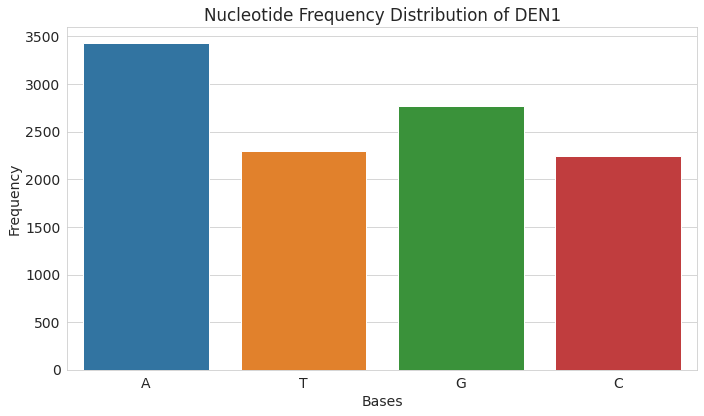

In [22]:
# frequency distribution of den1 
plotNucleotideFrequency(den1, "Nucleotide Frequency Distribution of DEN1", kind='bar')

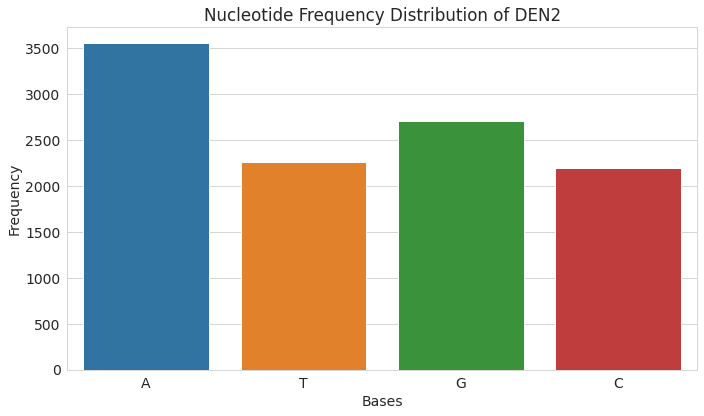

In [23]:
# frequency distribution of den2
plotNucleotideFrequency(den2, "Nucleotide Frequency Distribution of DEN2", kind='bar')

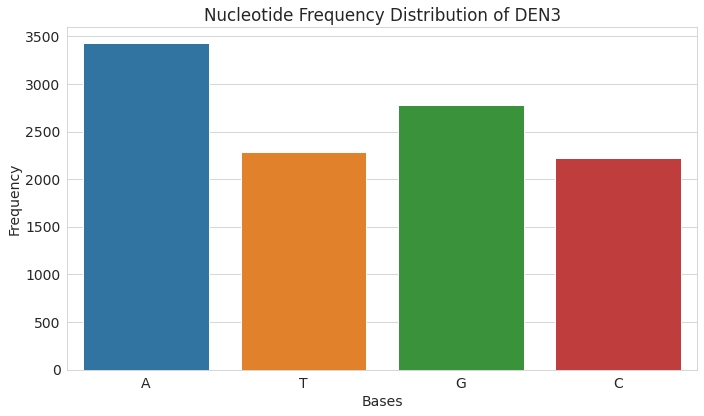

In [24]:
# frequency distribution of den3
plotNucleotideFrequency(den3, "Nucleotide Frequency Distribution of DEN3", kind='bar')

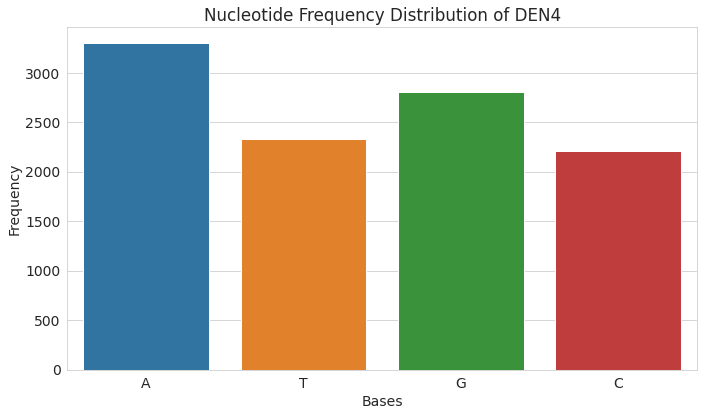

In [25]:
# frequency distribution of den4
plotNucleotideFrequency(den4, "Nucleotide Frequency Distribution of DEN4", kind='bar')

## Put it Together: Bar Charts
- Plot the frequency distribution of DEN1, DEN2, DEN3 and DEN4 in one place. 
- It helps us to compare the distribution.

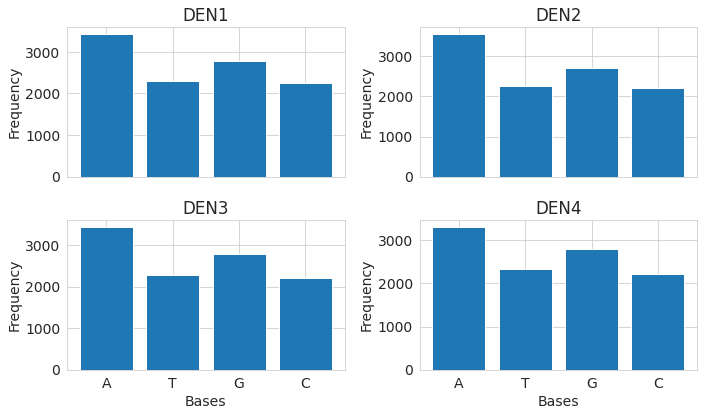

In [26]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, sharex=True)
# ax1 
freq1 = ntFrequency(den1)
ax1.bar(freq1.keys(), freq1.values())
ax1.set_title("DEN1")
ax1.set_ylabel("Frequency")

# ax2 
freq2 = ntFrequency(den2)
ax2.bar(freq2.keys(), freq2.values())
ax2.set_title("DEN2")
ax2.set_ylabel("Frequency")

# ax3
freq3 = ntFrequency(den3)
ax3.bar(freq3.keys(), freq3.values())
ax3.set_title("DEN3")
ax3.set_xlabel("Bases")
ax3.set_ylabel("Frequency")

# ax4 
freq4 = ntFrequency(den4)
ax4.bar(freq4.keys(), freq4.values())
ax4.set_title("DEN4")
ax4.set_xlabel("Bases")
ax4.set_ylabel("Frequency")

# layout
plt.tight_layout()
# plt.savefig('../output_figs/den_plot.png')
plt.show() 

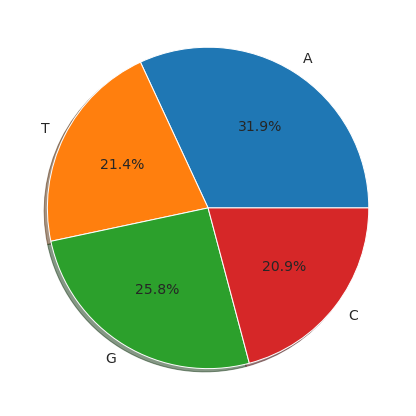

In [27]:
# pie chart of den1
plotNucleotideFrequency(den1, "Nucleotide Frequency Distribution of DEN1", kind='pie')

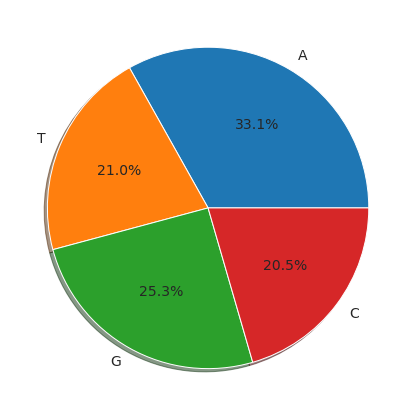

In [28]:
# pie chart of den2
plotNucleotideFrequency(den2, "Nucleotide Frequency Distribution of DEN2", kind='pie')

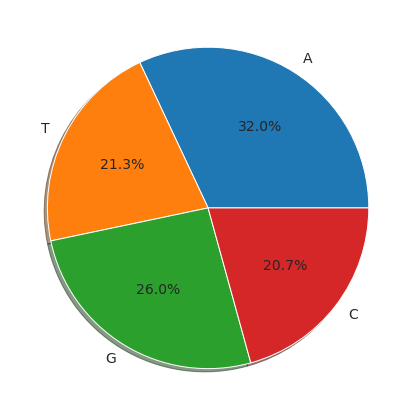

In [29]:
# pie chart of den3
plotNucleotideFrequency(den3, "Nucleotide Frequency Distribution of DEN3", kind='pie')

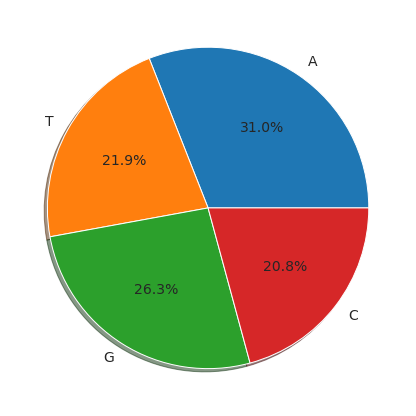

In [30]:
# pie chart of den4
plotNucleotideFrequency(den4, "Nucleotide Frequency Distribution of DEN4", kind='pie')

## Put it Together: Pie Charts
- Plot the frequency distribution of DEN1, DEN2, DEN3 and DEN4 in one place using pie chart. 
- It helps us to compare the distribution.

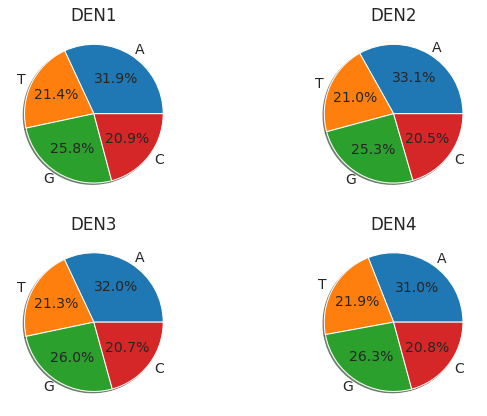

In [31]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, sharex=True)
# ax1 
freq1 = ntFrequency(den1)
ax1.pie(freq1.values(), labels=freq1.keys(), autopct='%1.1f%%', shadow=True)
ax1.set_title("DEN1")
# ax2 
freq2 = ntFrequency(den2)
ax2.pie(freq2.values(), labels=freq2.keys(), autopct='%1.1f%%', shadow=True)
ax2.set_title("DEN2")

# ax3
freq3 = ntFrequency(den3)
ax3.pie(freq3.values(), labels=freq3.keys(), autopct='%1.1f%%', shadow=True)
ax3.set_title("DEN3")

# ax4 
freq4 = ntFrequency(den4)
ax4.pie(freq4.values(), labels=freq4.keys(), autopct='%1.1f%%', shadow=True)
ax4.set_title("DEN4")

# layout
plt.tight_layout()
# plt.savefig('../output_figs/den_plot.png')
plt.show() 

## GC Calculation
- GC-content (or guanine-cytosine content) is the percentage of nitrogenous bases in a DNA or RNA molecule that are either guanine (G) or cytosine (C)
- In polymerase chain reaction (PCR) experiments, the GC-content of short oligonucleotides known as primers is often used to predict their annealing temperature to the template DNA. 
- A higher GC-content level indicates a relatively higher melting temperature.
- DNA with low GC-content is less stable than DNA with high GC-content

In [32]:
def calculateGC(seq):
    """
    Take DNA sequence as input and calculate the GC content.
    """
    no_of_g = seq.count("G")
    no_of_c = seq.count("C")
    total = no_of_g + no_of_c
    gc = round(total/len(seq) * 100, 2)
    return gc

In [33]:
print("GC Content of DEN1:", calculateGC(den1))
print("GC Content of DEN2:", calculateGC(den2))
print("GC Content of DEN3:", calculateGC(den3))
print("GC Content of DEN4:", calculateGC(den4))

GC Content of DEN1: 46.67
GC Content of DEN2: 45.82
GC Content of DEN3: 46.71
GC Content of DEN4: 47.12


### Narrative
- DEN4 is the most stable than DEN3 
- DEN1 is the most stable than DEN2 

In [34]:
def calculateAT(seq):
    """Take DNA sequence as input and calculate the AT content."""
    no_of_a = seq.count("A")
    no_of_t = seq.count("T")
    total = no_of_a + no_of_t
    at = round(total/len(seq) * 100, 2)
    return at


In [35]:
print("AT Content of DEN1:", calculateAT(den1))
print("AT Content of DEN2:", calculateAT(den2))
print("AT Content of DEN3:", calculateAT(den3))
print("AT Content of DEN4:", calculateAT(den4))

AT Content of DEN1: 53.33
AT Content of DEN2: 54.18
AT Content of DEN3: 53.29
AT Content of DEN4: 52.88


## Sliding Window Analysis of GC

In [36]:
def subSeqGC(seq, window=300):
    """Returns sub-sequence GC distribution"""
    res = [] 
    for i in range(0, len(seq)-window+1, window):
        subseq = seq[i:i+window]
        gc = calculateGC(subseq)
        res.append(gc)
    return res

In [37]:
gc1 = subSeqGC(den1, window=300)
gc2 = subSeqGC(den2, window=300)
gc3 = subSeqGC(den3, window=300)
gc4 = subSeqGC(den4, window=300)

In [38]:
def plotGCDistribution(seq, title="GC Distribution of Sub-sequence", xlab="Ranges", ylab="% GC"):
    """Plots the GC content along a sequence using a sliding window"""
    gc = subSeqGC(seq, 10000)
    sns.lineplot(range(len(gc)), sorted(gc))
    plt.title(title)
    plt.xlabel(xlab)
    plt.ylabel(ylab)
    plt.tight_layout()
    plt.show()

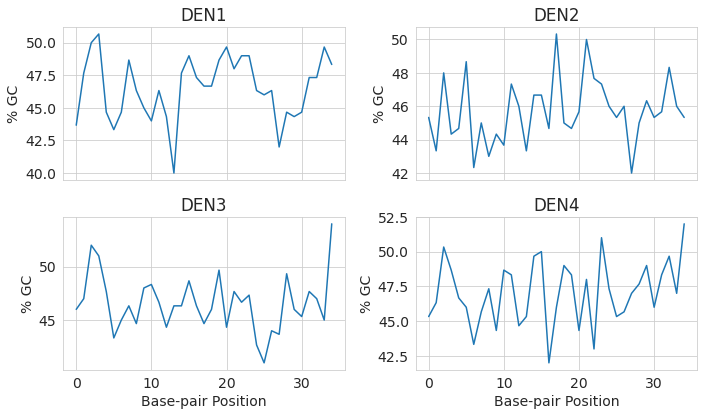

In [39]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, sharex=True)
# ax1 
gc1 = subSeqGC(den1, 300)
ax1.plot(range(len(gc1)), gc1)
ax1.set_title("DEN1")
ax1.set_ylabel("% GC")

# ax2 
gc2 = subSeqGC(den2, 300)
ax2.plot(range(len(gc2)), gc2)
ax2.set_title("DEN2")
ax2.set_ylabel("% GC")

# ax3
gc3 = subSeqGC(den3, 300)
ax3.plot(range(len(gc3)), gc3)
ax3.set_title("DEN3")
ax3.set_xlabel("Base-pair Position")
ax3.set_ylabel("% GC")

# ax4 
gc4 = subSeqGC(den4, 300)
ax4.plot(range(len(gc4)), gc4)
ax4.set_title("DEN4")
ax4.set_xlabel("Base-pair Position")
ax4.set_ylabel("% GC")

# layout
plt.tight_layout()
# plt.savefig('../output_figs/den_plot.png')
plt.show() 

## Sliding Window Analysis of AT

In [40]:
def subSeqAT(seq, window=1000):
    """Returns sub-sequence GC distribution"""
    res = []
    for i in range(0, len(seq)-window+1, window):
        subseq = seq[i:i+window]
        gc = calculateAT(subseq)
        res.append(gc)
    return res

In [41]:
at1 = subSeqAT(den1, window=300)
at2 = subSeqAT(den2, window=300)
at3 = subSeqAT(den3, window=300)
at = subSeqAT(den4, window=300)

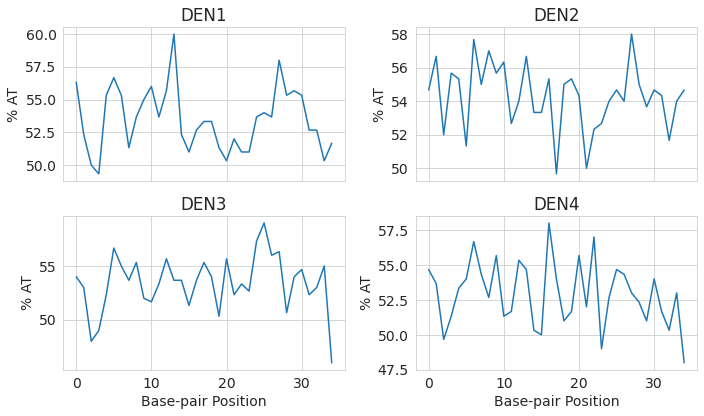

In [42]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, sharex=True)
# ax1 
at1 = subSeqAT(den1, 300)
ax1.plot(range(len(at1)), at1)
ax1.set_title("DEN1")
ax1.set_ylabel("% AT")

# ax2 
at2 = subSeqAT(den2, 300)
ax2.plot(range(len(at2)), at2)
ax2.set_title("DEN2")
ax2.set_ylabel("% AT")

# ax3
at3 = subSeqAT(den3, 300)
ax3.plot(range(len(at3)), at3)
ax3.set_title("DEN3")
ax3.set_xlabel("Base-pair Position")
ax3.set_ylabel("% AT")

# ax4 
at4 = subSeqAT(den4, 300)
ax4.plot(range(len(at4)), at4)
ax4.set_title("DEN4")
ax4.set_xlabel("Base-pair Position")
ax4.set_ylabel("% AT")

# layout
plt.tight_layout()
# plt.savefig('../output_figs/den_plot.png')
plt.show() 

## K-mer Analysis 

In [43]:
def buildKmers(sequence, ksize):
    """Returns k-mers on the basis of ksize."""
    kmers = []
    n_kmers = len(sequence) - ksize + 1
    for i in range(n_kmers):
        kmer = sequence[i:i + ksize]
        kmers.append(kmer)
    return kmers

In [44]:
# build dimers 
km1 = buildKmers(den1, 2)
km2 = buildKmers(den2, 2)
km3 = buildKmers(den3, 2)
km4 = buildKmers(den4, 2)

In [45]:
# dimer frequency
def kmerFrequency(seq):
    """Returns frequencies of kmers"""
    counts = Counter(seq)
    return counts

In [46]:
print("Dimer Frequency of DEN1:\n", kmerFrequency(km1))
print("Dimer Frequency of DEN2:\n", kmerFrequency(km2))
print("Dimer Frequency of DEN3:\n", kmerFrequency(km3))
print("Dimer Frequency of DEN4:\n", kmerFrequency(km4))

Dimer Frequency of DEN1:
 Counter({'AA': 1108, 'GA': 976, 'CA': 901, 'AG': 890, 'TG': 832, 'GG': 787, 'AC': 720, 'AT': 708, 'CT': 555, 'TT': 529, 'CC': 523, 'GT': 507, 'GC': 500, 'TC': 497, 'TA': 440, 'CG': 261})
Dimer Frequency of DEN2:
 Counter({'AA': 1174, 'GA': 1010, 'AG': 939, 'CA': 931, 'TG': 795, 'GG': 750, 'AT': 726, 'AC': 714, 'TT': 532, 'CT': 530, 'CC': 510, 'TC': 492, 'GC': 484, 'GT': 469, 'TA': 437, 'CG': 229})
Dimer Frequency of DEN3:
 Counter({'AA': 1120, 'GA': 951, 'CA': 926, 'AG': 895, 'TG': 828, 'GG': 827, 'AC': 738, 'AT': 672, 'TT': 576, 'CT': 552, 'GC': 524, 'CC': 507, 'GT': 481, 'TC': 449, 'TA': 427, 'CG': 233})
Dimer Frequency of DEN4:
 Counter({'AA': 1033, 'GA': 990, 'AG': 911, 'CA': 883, 'TG': 841, 'GG': 828, 'AT': 681, 'AC': 673, 'TT': 595, 'CC': 565, 'CT': 542, 'GT': 515, 'TC': 505, 'GC': 471, 'TA': 391, 'CG': 224})


## Plotting K-mer Frequency Distribution

In [47]:
def plotKmerFrequency(seq, title=False, xlab='Dimer', ylab='Frequency', kind=None):
    """Plots the kmers frequency"""
    freq = kmerFrequency(seq)
    df = pd.DataFrame(freq.items(), columns = ['letters', 'frequency'])
    if kind == 'bar':
        sns.barplot(x='letters', y='frequency', data=df)
        plt.title(title)
        plt.xlabel(xlab)
        plt.ylabel(ylab)
        plt.tight_layout()
        plt.show()
    elif kind == 'pie':
        plt.pie(freq.values(), labels=freq.keys(), autopct='%1.1f%%', shadow=True)
        plt.tight_layout()
        plt.show()
    else:
        print("Please select your visualization type either bar or pie chart!")


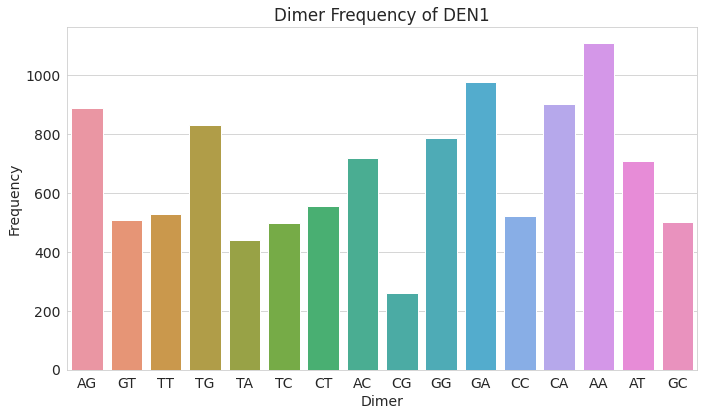

In [48]:
# dimer frequency of den1
plotKmerFrequency(km1, "Dimer Frequency of DEN1", kind='bar')

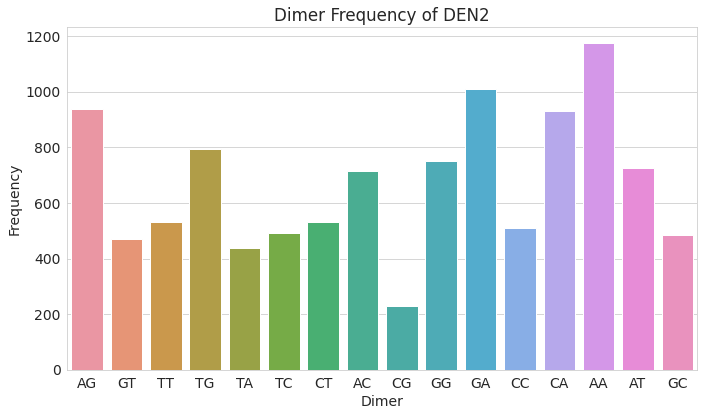

In [49]:
# dimer frequency of den2
plotKmerFrequency(km2, "Dimer Frequency of DEN2", kind='bar')

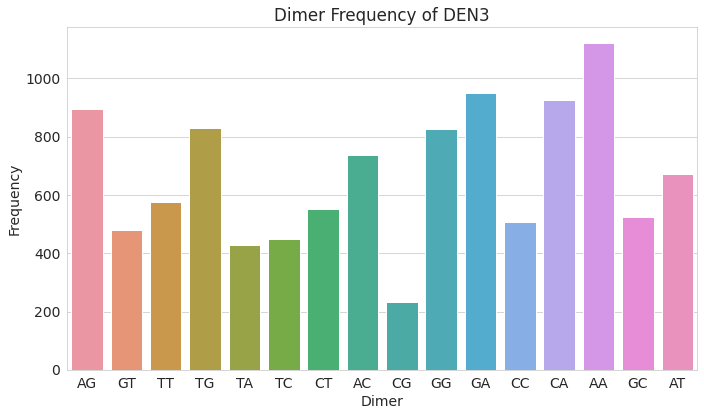

In [50]:
# dimer frequency of den3
plotKmerFrequency(km3, "Dimer Frequency of DEN3", kind='bar')

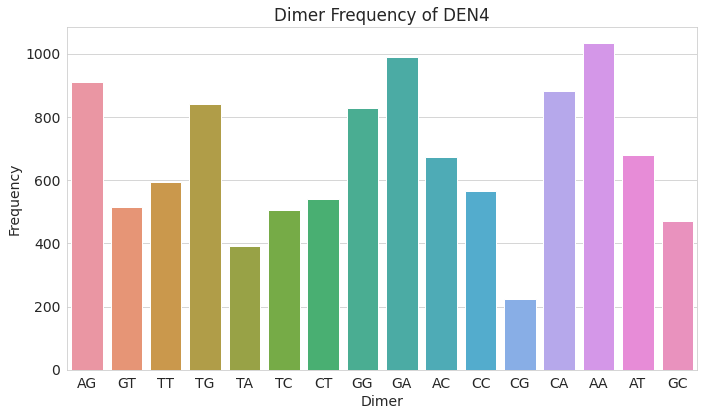

In [51]:
# dimer frequency of den4
plotKmerFrequency(km4, "Dimer Frequency of DEN4", kind='bar')

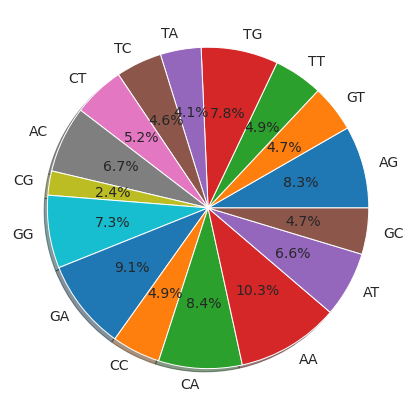

In [52]:
# k-mer frequency of den1 using pie chart
plotKmerFrequency(km1, kind='pie')

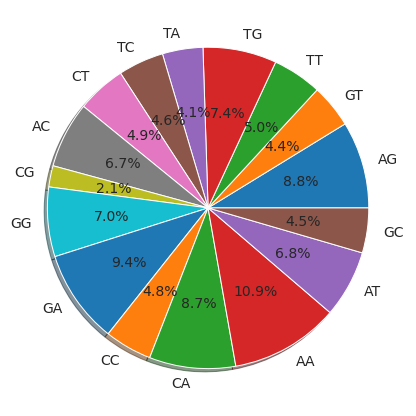

In [53]:
# k-mer frequency of den2 using pie chart
plotKmerFrequency(km2,kind='pie')

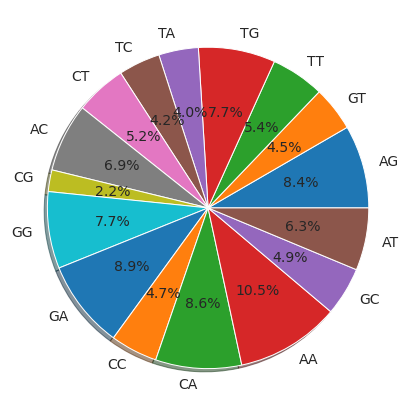

In [54]:
# k-mer frequency of den3 using pie chart
plotKmerFrequency(km3,kind='pie')

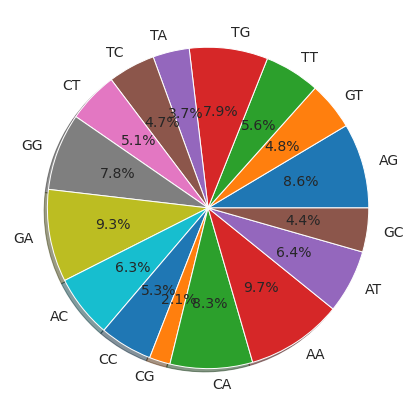

In [55]:
# k-mer frequency of den4 using pie chart
plotKmerFrequency(km4,kind='pie')

## K-mer Frequency Distribution Together 

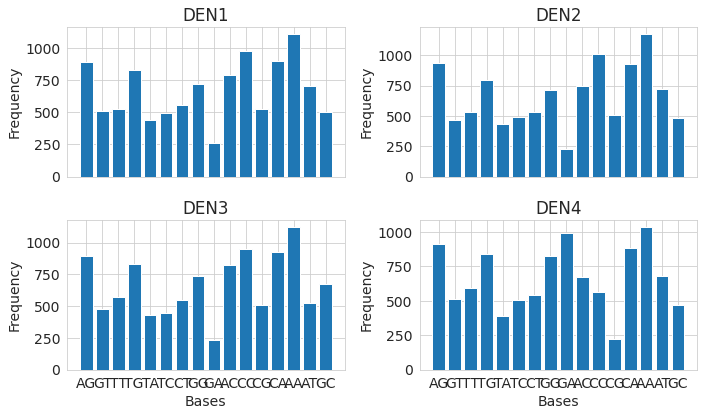

In [56]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, sharex=True)

# ax1 
freq1 = kmerFrequency(km1)
ax1.bar(freq1.keys(), freq1.values())
ax1.set_title("DEN1")
ax1.set_ylabel("Frequency")
# ax2 
freq2 = kmerFrequency(km2)
ax2.bar(freq2.keys(), freq2.values())
ax2.set_title("DEN2")
ax2.set_ylabel("Frequency")

# ax3
freq3 = kmerFrequency(km3)
ax3.bar(freq3.keys(), freq3.values())
ax3.set_title("DEN3")
ax3.set_xlabel("Bases")
ax3.set_ylabel("Frequency")

# ax4 
freq4 = kmerFrequency(km4)
ax4.bar(freq4.keys(), freq4.values())
ax4.set_title("DEN4")
ax4.set_xlabel("Bases")
ax4.set_ylabel("Frequency")

# layout
plt.tight_layout()
# plt.savefig('../output_figs/den_plot.png')
plt.show() 

## Hamming Distance 
- It shows how many places 2 strings differ
- Hamming distance between two strings of equal length is the number of positions at which the corresponding symbols are different. 
- In other words, it measures the minimum number of substitutions required to change one string into the other, or the minimum number of errors that could have transformed one string into the other
- It is used for error detection or error correction
- It is used to quantify the similarity of DNA sequences
- For checking the edit distance
    - edit distance is a way of quantifying how dissimilar two strings (e.g., words) are to one another by counting the minimum number of operations required to transform one string into the other. 
    - eg; Levenshtein distance

In [57]:
# using python 
def hamming_distance(seq1, seq2): 
    """Returns hamming distance between 2 sequences"""
    return len([(x,y) for x, y in zip(seq1, seq2) if x != y])

In [58]:
print("Hamming Distance of DEN1 and DEN2:", hamming_distance(den1[1:200], den2[1:200]))
print("Hamming Distance of DEN1 and DEN3:", hamming_distance(den1[1:200], den3[1:200]))
print("Hamming Distance of DEN1 and DEN4:", hamming_distance(den1[1:200], den4[1:200]))

Hamming Distance of DEN1 and DEN2: 109
Hamming Distance of DEN1 and DEN3: 12
Hamming Distance of DEN1 and DEN4: 93


In [59]:
print("Hamming Distance of DEN2 and DEN3:", hamming_distance(den2[1:200], den3[1:200]))
print("Hamming Distance of DEN2 and DEN4:", hamming_distance(den2[1:200], den4[1:200]))
print("Hamming Distance of DEN3 and DEN4:", hamming_distance(den3[1:200], den4[1:200]))

Hamming Distance of DEN2 and DEN3: 111
Hamming Distance of DEN2 and DEN4: 104
Hamming Distance of DEN3 and DEN4: 97


In [60]:
# using scikit-bio library
def calculateHammingDistance(seq1, seq2):
    """Returns hamming distance between two equal length sequences"""
    seq1 = Sequence(seq1)
    seq2 = Sequence(seq2)
    result = hamming(seq1, seq2)
    return result

In [61]:
print("Hamming Distance of DEN1 and DEN2:", round(calculateHammingDistance(den1[1:200], den2[1:200]), 2))
print("Hamming Distance of DEN1 and DEN3:", round(calculateHammingDistance(den1[1:200], den3[1:200]), 2))
print("Hamming Distance of DEN1 and DEN4:", round(calculateHammingDistance(den1[1:200], den4[1:200]), 2))

Hamming Distance of DEN1 and DEN2: 0.55
Hamming Distance of DEN1 and DEN3: 0.06
Hamming Distance of DEN1 and DEN4: 0.47


In [62]:
print("Hamming Distance of DEN2 and DEN3:", round(calculateHammingDistance(den2[1:200], den3[1:200]), 2))
print("Hamming Distance of DEN2 and DEN4:", round(calculateHammingDistance(den2[1:200], den4[1:200]), 2))
print("Hamming Distance of DEN3 and DEN4:", round(calculateHammingDistance(den3[1:200], den4[1:200]), 2))

Hamming Distance of DEN2 and DEN3: 0.56
Hamming Distance of DEN2 and DEN4: 0.52
Hamming Distance of DEN3 and DEN4: 0.49


## Dot Plot 
- A dot plot is a graphical method that allows the comparison of two biological sequences and identify regions of close similarity between them.
- Simplest method - put a dot wherever sequences are identical
- Dot plots compare two sequences by organizing one sequence on the x-axis, and another on the y-axis, of a plot.
- When the residues of both sequences match at the same location on the plot, a dot is drawn at the corresponding position

### Usefulness 
- Dot plots can also be used to visually inspect sequences for
    - direct or inverted repeats
    - regions with low sequence complexity.
    - Similar regions
    - Repeated sequences
    - Sequence rearrangements
    - RNA structures
    - Gene order

## Dot Plot: for DNA Sequence 

In [63]:

def __delta(x,y):
    return 0 if x == y else 1

def __M(seq1,seq2,i,j,k):
    return sum(__delta(x,y) for x,y in zip(seq1[i:i+k],seq2[j:j+k]))

def __makeMatrix(seq1,seq2,k):
    n = len(seq1)
    m = len(seq2)
    return [[__M(seq1,seq2,i,j,k) for j in range(m-k+1)] for i in range(n-k+1)]


def __plotMatrix(__M,t, seq1, seq2, nonblank = chr(0x25A0), blank = ' '):
    print(' |' + seq2)
    print('-'*(2 + len(seq2)))
    for label,row in zip(seq1,M):
        line = ''.join(nonblank if s < t else blank for s in row)
        print(label + '|' + line)

def dotPlot(seq1,seq2):
    """Create a dotplot for checking sequence similarity"""
    plt.imshow(np.array(__makeMatrix(seq1,seq2,1)), cmap='viridis', interpolation='nearest', aspect='auto')
    plt.colorbar()
    plt.clim(-1, 1)
    # on x-axis list all sequences of seq 2
    xt=plt.xticks(np.arange(len(list(seq2))),list(seq2))
    # on y-axis list all sequences of seq 1
    yt=plt.yticks(np.arange(len(list(seq1))),list(seq1))
    plt.show()


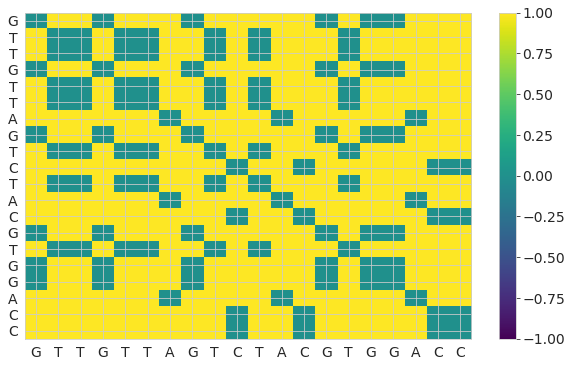

In [64]:
# 20x20 matrix of den1 and den2 
dotPlot(den1[1:21], den2[1:21])

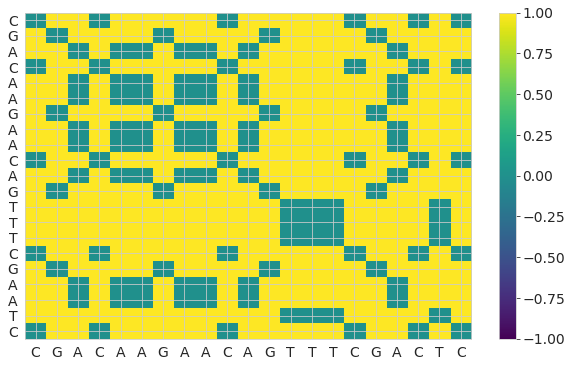

In [65]:
# 20x20 matrix of den1 and den3 
dotPlot(den1[20:41], den3[20:41])

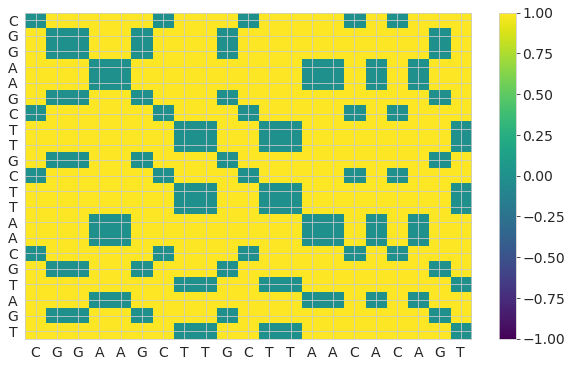

In [66]:
# 20x20 matrix of den1 and den4
dotPlot(den1[40:61], den4[40:61])

## Nucleotide Density

In [67]:
def __ntDensityPlot(xvar,ydict,xlab,ylab):
    """Makes a scatterplot of y-variable(s) against an x-variable"""
    yvarnames = []
    for yvar in ydict:
        yvarnames.append(yvar)
        sns.lineplot(xvar,ydict[yvar])
    plt.xlabel(xlab)
    plt.ylabel(ylab)
    plt.legend(yvarnames, loc="upper right")
    plt.show()

In [68]:
def ntDensityOne(seq,windowsize,verbose=False,jumpsize=1000,makePlot=True):
    """Plots the base frequency along a sequence using a sliding window"""
    length = len(seq)
    # make a dictionary to contain four empty lists
    freqs = { "A": [], "T": [], "G": [], "C": [] }
    myset = ("A", "C", "T", "G")
    midpoints = []
    # Move the window by jumpsize bp at a time.
    for i in range(0,length-windowsize+1,jumpsize):
        subseq = seq[i:i+windowsize]
        if verbose:
            start = i
            end = i+windowsize
            print("start %d end %d subseq is %s length %d windowsize %d" % (start,end,subseq,length,windowsize))
        assert len(subseq)==windowsize, "ERROR: ntdensity2: length of subseq is not windowsize"
        for letter in myset:
            num = subseq.count(letter)
            pc = 100 * num/windowsize
            freqs[letter].append(pc)
        # Find the mid-point of the window:
        # For example, if the window is from i=1000 to i=11000,
        # midpoint = 12000/2 = 6000
        midpoint = (i + i + windowsize)/2
        midpoints.append(midpoint)
    if makePlot:
        # Call the plotting function
        midpoints2 = [x/1000 for x in midpoints] # list comprehension
        __ntDensityPlot(midpoints2,freqs,'Base-Pair Position (kb)','% of Nucleotide') # Convert to kb for plotting


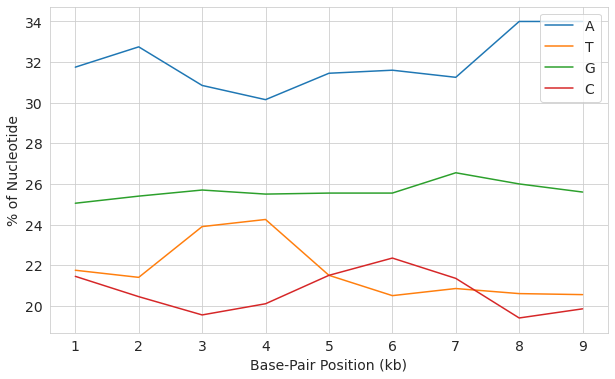

In [69]:
# nucleotide density of den1 
ntDensityOne(den1, windowsize=2000)

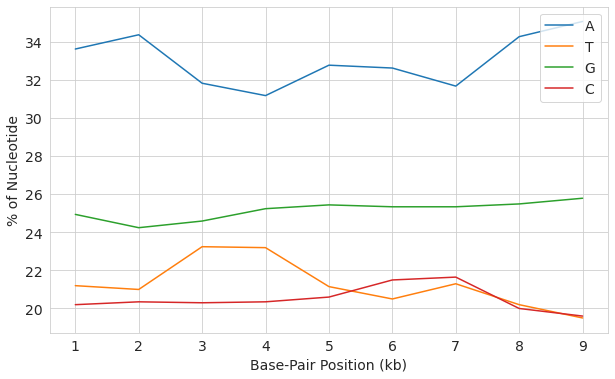

In [70]:
# nucleotide density of den2 
ntDensityOne(den2, windowsize=2000)

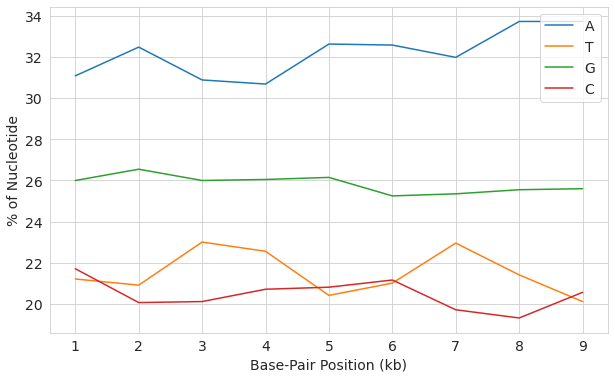

In [71]:
# nucleotide density of den3 
ntDensityOne(den3, windowsize=2000)

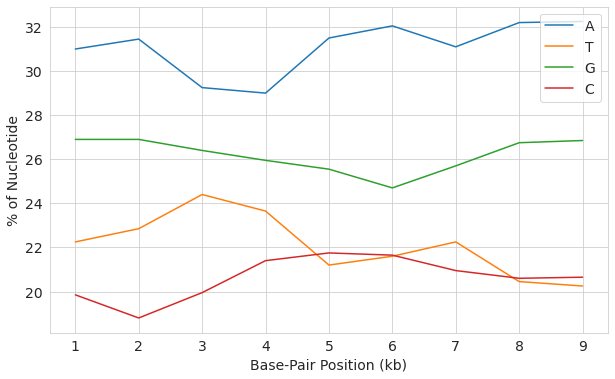

In [72]:
# nucleotide density of den4 
ntDensityOne(den4, windowsize=2000)

## Dimer Density

In [73]:
def ntDensityTwo(seq,windowsize,verbose=False,jumpsize=1000,makePlot=True):
    """Plots the G+C content along a sequence using a sliding window"""
    length = len(seq)
    # Make a dictionary to contain two empty lists
    freqs = { "G+C": [], "A+T": [] }
    myset = ("A+T", "G+C")
    # Note: instead of storing G+C, A+T in a hash, could just have coded G+C=0, A+T=1, and stored these values in arrays.
    midpoints = []
    # Move the window by jumpsize bp at a time.
    # The first window we look at is from i=0 to i=windowsize.
    # For example, if the sequence is 30000 bases long, windowsize=10000.
    # In the first loop, we look at i=0 to i=10000.
    # In the second loop, we look at i=1000 to i=11000. ...
    # In the last loop, we look at i=29000 to i=30000.
    # Note: for i = range(0,10) goes from i=0...9.
    for i in range(0,length-windowsize+1,jumpsize):
        subseq = seq[i:i+windowsize]
        if verbose:
            start = i
            end = i+windowsize
            print("start %d end %d subseq is %s length %d windowsize %d" % (start,end,subseq,length,windowsize))
        assert len(subseq)==windowsize, "ERROR: ntdensity1: length of subseq is not windowsize"
        for dimer in myset:
            letter1 = dimer[0:1]
            letter2 = dimer[2:3]
            num1 = subseq.count(letter1)
            num2 = subseq.count(letter2)
            num = num1 + num2
            pc = (100 * num)/windowsize
            freqs[dimer].append(pc)
        # Find the mid-point of the window:
        # For example, if the window is from i=1000 to i=11000,
        # midpoint = 12000/2 = 6000
        midpoint = (i + i + windowsize)/2
        midpoints.append(midpoint)
    if makePlot:
        # Call the plotting function
        midpoints2 = [x/1000 for x in midpoints] # list comprehension
        __ntDensityPlot(midpoints2,freqs,'Base-Pair Position (kb)','%  of Nucleotide') # Convert to kb for plotting


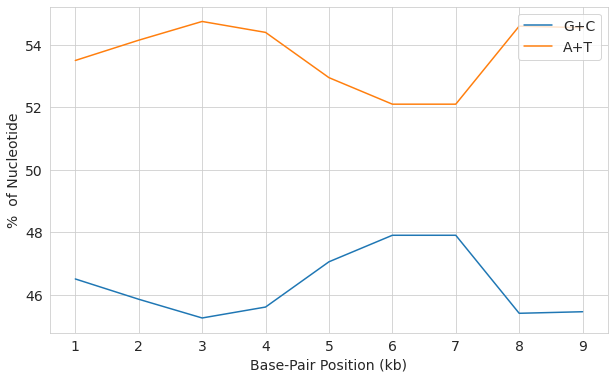

In [74]:
# dimer density of den1 
ntDensityTwo(den1, windowsize=2000)

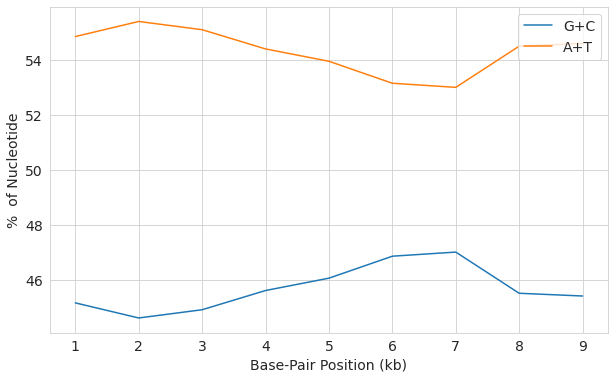

In [75]:
# dimer density of den2 
ntDensityTwo(den2, windowsize=2000)

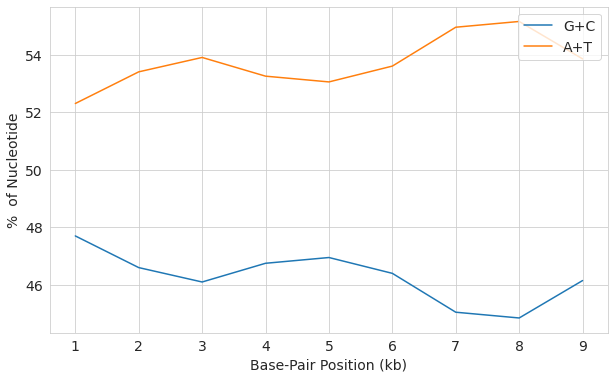

In [76]:
# dimer density of den3 
ntDensityTwo(den3, windowsize=2000)

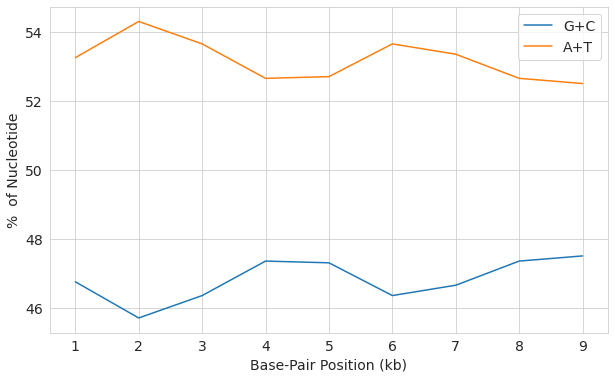

In [77]:
# dimer density of den4 
ntDensityTwo(den4, windowsize=2000)

## Translation and Protein Sequence Analysis 

In [78]:
# load sequence as biopython
s1 = SeqIO.read('../dengue/den1.fasta', "fasta")
s2 = SeqIO.read('../dengue/den2.fasta', "fasta")
s3 = SeqIO.read('../dengue/den3.fasta', "fasta")
s4 = SeqIO.read('../dengue/den4.fasta', "fasta")

In [79]:
# get sequence object 
seq1 = s1.seq 
seq2 = s2.seq 
seq3 = s3.seq 
seq4 = s4.seq 

In [81]:
# translation
prt1 = seq1.translate()
prt2 = seq2.translate()
prt3 = seq3.translate()
prt4 = seq4.translate()

In [82]:
# examine few lines 
prt1[1:500]

Seq('C*STWTDKNSFESEACLT*F*QFFIREQISDEQPTEKDGSTVFQYAETREKPRV...T*N', HasStopCodon(ExtendedIUPACProtein(), '*'))

In [83]:
# examine few lines 
prt2[1:500]

Seq('C*STWTDKDRFFEGAKLNVVLTVF*LESRSLMNNQRKKAKNTPFNMLKRERNRV...SPR', HasStopCodon(ExtendedIUPACProtein(), '*'))

In [84]:
# examine few lines 
prt3[1:500]

Seq('C*STWTDKNSFDSEACLT*C*QFFIREQISDEQPTEEDGKTVYQYAETREKPCV...DRF', HasStopCodon(ExtendedIUPACProtein(), '*'))

In [85]:
# examine few lines 
prt4[1:500]

Seq('C*SVWTDKDSSKSEACLTQF*QFV*IESRSLEK*TNEKRWLDHLSIC*NARETA...VNP', HasStopCodon(ExtendedIUPACProtein(), '*'))

## Protein Length

In [86]:
print("Protein Length of DEN1: ", len(prt1))
print("Protein Length of DEN2: ", len(prt2))
print("Protein Length of DEN3: ", len(prt3))
print("Protein Length of DEN4: ", len(prt4))

Protein Length of DEN1:  3578
Protein Length of DEN2:  3574
Protein Length of DEN3:  3569
Protein Length of DEN4:  3549


## Protein Frequency 

In [87]:
def proteinFrequency(seq):
    """Count the frequencies of each protein in sequence including every letter"""
    prt_freq = Counter(seq)
    return prt_freq

In [88]:
print("Protein Frequency of DEN1:\n ", proteinFrequency(prt1))
print("Protein Frequency of DEN2:\n ", proteinFrequency(prt2))
print("Protein Frequency of DEN3:\n ", proteinFrequency(prt3))
print("Protein Frequency of DEN4:\n ", proteinFrequency(prt4))

Protein Frequency of DEN1:
  Counter({'R': 362, 'S': 330, 'G': 291, 'H': 208, 'K': 205, 'T': 200, 'N': 195, 'L': 191, 'E': 166, 'P': 166, '*': 161, 'V': 153, 'D': 143, 'Q': 143, 'I': 132, 'A': 131, 'C': 112, 'W': 90, 'F': 83, 'M': 61, 'Y': 55})
Protein Frequency of DEN2:
  Counter({'L': 330, 'G': 285, 'T': 271, 'E': 247, 'K': 235, 'A': 232, 'V': 224, 'I': 224, 'R': 214, 'S': 211, 'P': 155, 'N': 141, 'D': 137, 'M': 136, 'Q': 111, 'F': 104, 'W': 94, 'H': 73, 'Y': 73, 'C': 66, '*': 11})
Protein Frequency of DEN3:
  Counter({'R': 361, 'G': 315, 'S': 304, 'N': 216, 'T': 204, 'H': 196, 'L': 195, 'K': 183, 'E': 179, '*': 164, 'P': 155, 'A': 151, 'Q': 146, 'V': 143, 'D': 131, 'I': 113, 'C': 107, 'F': 94, 'W': 88, 'Y': 70, 'M': 54})
Protein Frequency of DEN4:
  Counter({'L': 297, '*': 280, 'S': 277, 'R': 246, 'Q': 238, 'T': 230, 'G': 229, 'K': 228, 'P': 226, 'E': 211, 'W': 138, 'C': 123, 'A': 112, 'V': 108, 'H': 105, 'I': 104, 'F': 98, 'N': 97, 'M': 86, 'D': 73, 'Y': 43})


## Most Common Amino Acids

In [89]:
print("Most Common Amino Acids in DEN1:\n ", Counter(prt1).most_common(10))
print("Most Common Amino Acids in DEN2:\n ", Counter(prt2).most_common(10))
print("Most Common Amino Acids in DEN3:\n ", Counter(prt3).most_common(10))
print("Most Common Amino Acids in DEN4:\n ", Counter(prt4).most_common(10))

Most Common Amino Acids in DEN1:
  [('R', 362), ('S', 330), ('G', 291), ('H', 208), ('K', 205), ('T', 200), ('N', 195), ('L', 191), ('E', 166), ('P', 166)]
Most Common Amino Acids in DEN2:
  [('L', 330), ('G', 285), ('T', 271), ('E', 247), ('K', 235), ('A', 232), ('V', 224), ('I', 224), ('R', 214), ('S', 211)]
Most Common Amino Acids in DEN3:
  [('R', 361), ('G', 315), ('S', 304), ('N', 216), ('T', 204), ('H', 196), ('L', 195), ('K', 183), ('E', 179), ('*', 164)]
Most Common Amino Acids in DEN4:
  [('L', 297), ('*', 280), ('S', 277), ('R', 246), ('Q', 238), ('T', 230), ('G', 229), ('K', 228), ('P', 226), ('E', 211)]


## Plotting Protein Frequency Distribution

In [90]:
def plotProteinFrequency(seq, title=False, xlab="Proteins",ylab="Frequency", kind=None):
    """Makes a scatterplot of y-variable(s) against an x-variable"""
    if kind == 'bar':
        freq = Counter(seq)
        df = pd.DataFrame(freq.items(), columns = ['letters', 'frequency'])
        sns.barplot(x='letters', y='frequency', data=df)
        plt.title(title,  fontsize=14)
        plt.xlabel(xlab,  fontsize=14)
        plt.ylabel(ylab,  fontsize=14)
        plt.tight_layout()
        plt.show()
    elif kind == 'pie':
        freq = Counter(seq)
        plt.pie(freq.values(), labels=freq.keys(), autopct='%1.1f%%', shadow=True)
        plt.tight_layout()
        plt.show()
    else:
        print("Please select your visualization type either bar or pie chart!")


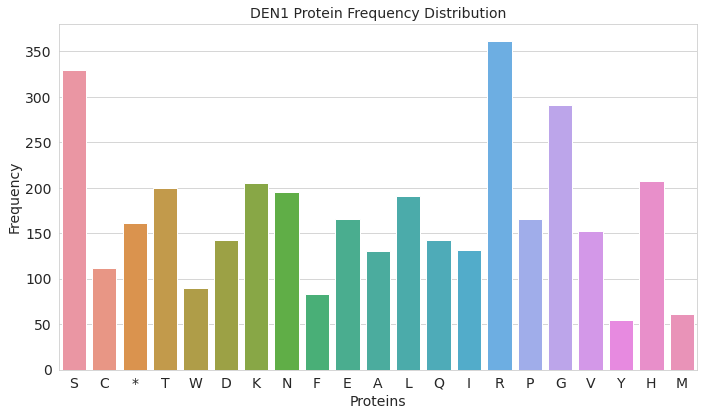

In [91]:
# protein frequency distribution of den1 
plotProteinFrequency(prt1, "DEN1 Protein Frequency Distribution", kind='bar')

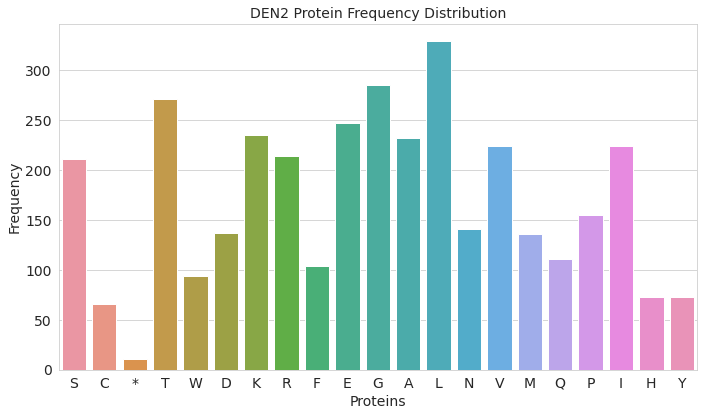

In [92]:
# protein frequency distribution of den2
plotProteinFrequency(prt2, "DEN2 Protein Frequency Distribution", kind='bar')

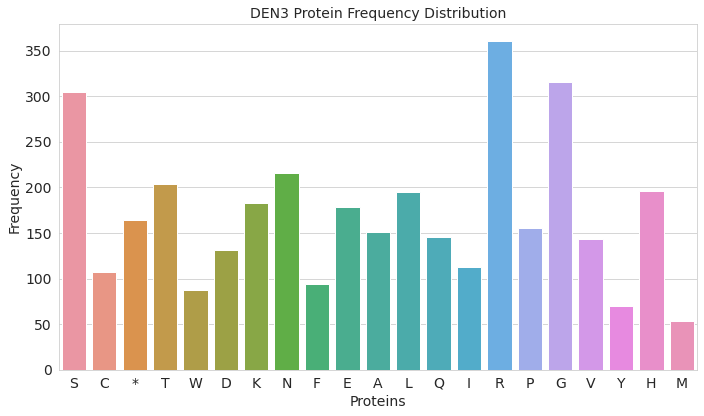

In [93]:
# protein frequency distribution of den3
plotProteinFrequency(prt3, "DEN3 Protein Frequency Distribution", kind='bar')

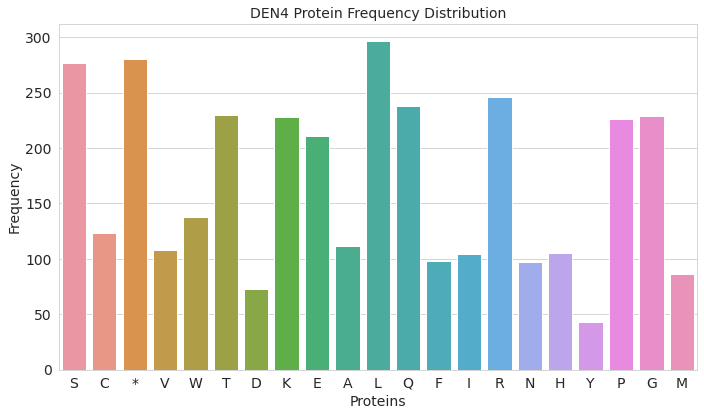

In [94]:
# protein frequency distribution of den4
plotProteinFrequency(prt4, "DEN4 Protein Frequency Distribution", kind='bar')

## Dot Plot: for Protein Sequence 

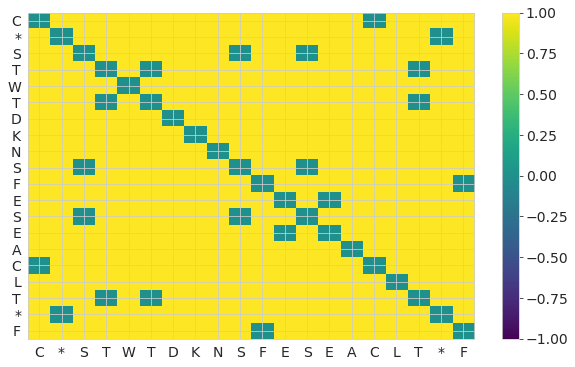

In [95]:
# dotplot of den1 protein and den2 
dotPlot(prt1[1:21], prt1[1:21])

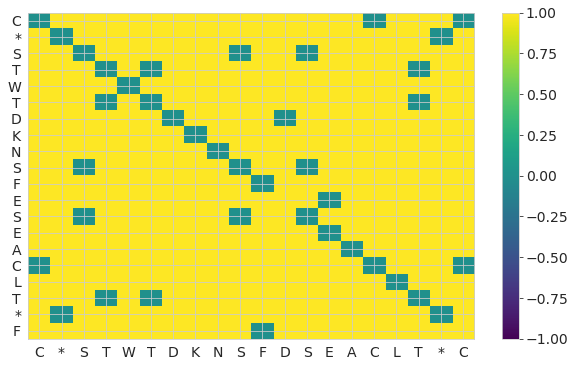

In [96]:
# dotplot of den1 protein and den3
dotPlot(prt1[1:21], prt3[1:21])

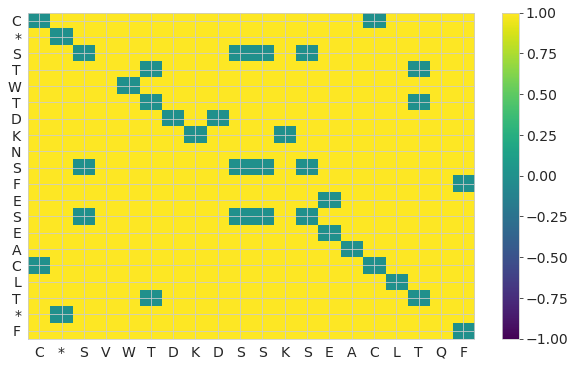

In [97]:
# dotplot of den1 protein and den3
dotPlot(prt1[1:21], prt4[1:21])

## Sequence Alignments 
- Global alignment: finds the best concordance/agreement betwenn all characters in two sequences
- Local Alignment: finds just the subsequences that align the best

In [98]:
# import sequence alignment library
from Bio import pairwise2 
from Bio.pairwise2 import format_alignment

In [99]:
# alignments 
alignments = pairwise2.align.globalxx(seq1, seq2)

In [103]:
# to see it weel 
print(format_alignment(*alignments[0]))

AGTTGTTAGTCTACGTGGACCGACAAGA-ACAGT-TTC---GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

In [105]:
# to see 2nd part 
print(format_alignment(*alignments[1]))

AGTTGTTAGTCTACGTGGACCGACAA-GAACAGT-TTC---GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

In [106]:
# to see all alignments 
for a in alignments: 
    print(format_alignment(*a))

AGTTGTTAGTCTACGTGGACCGACAAGA-ACAGT-TTC---GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGAC-AAGAACAGT-TTC---GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACA-AGAACAGTTTC---GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GGC

AGTTGTTAGTCTACGTGGACCGACA-AGAACAG-TTTC---GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACAA-GAACAG-TTTC---GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACAA-GAACAG-TT-TC--GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGAC-AAGAACAG-TT-TC-GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GGC

AGTTGTTAGTCTACGTGGACCGACAA-GAACAG-TT--TC-GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGAC-AAGAACAG-TT--TC-GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACA-AGAACAG-T--TTC-GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACA-AGAACAG--T-TTC-GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACAA-GAACAG-TT-T-CGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GGC

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



AGTTGTTAGTCTACGTGGACCGAC-AAGAACAG-TT---TCGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACAA-GAACAG-T--T-TCGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACAA-GAACAG--T-T-TCGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACAA-GAACAG-T---TTCGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACAA-GAACAG--T--TTCGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACAA-GAACAG----TTTCGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACAAGA-ACAGT-TTC---GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGAC-AAGAACAGT-TTC---GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGAC-AAGAACAGTTTC---GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GGC

AGTTGTTAGTCTACGTGGACCGACAAGA-ACAG-TTTC---GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACAAGA-ACAG-TT-TC--GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



AGTTGTTAGTCTACGTGGACCGAC-AAGAACAG--T-TTC-GAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGAC-AAGAACAG-TT-T-CGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GGC

AGTTGTTAGTCTACGTGGACCGAC-AAGAACAG-TT--TCGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GGC

AGTTGTTAGTCTACGTGGACCGACAA-GAACAG-T--TTCGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GGC

AGTTGTTAGTCTACGTGGACCGAC-AAGAACAG--T-TTCGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GGC

AGTTGTTAGTCTACGTGGACCGACAA-GAACAG-TT---TCGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACAA-GAACAG-T--T-TCGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACAA-GAACAG--T-T-TCGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACA-AGAACAG-T---TTCGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACAA-GAACAG--T--TTCGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

AGTTGTTAGTCTACGTGGACCGACAA-GAACAG----TTTCGAATCGGA-AGCTT--GCTT-AACGTAGTTCTAACAGTTTTTTA-TTAGAGAGCAGATCTCTGATGAAC-AACCAACGGAAAAAGACGGGTCGA----C-CGTC-TTTCAATATGCTGAAACGCGC-GAGAAACCGCGTGTCA-ACTGTTT-CA-CAGT-TGG-CGAA-GAGATTCTCAAAA---GGAT-TGCTTT-CAGGCC-A--AGGACCCATG-AAAT--TGGTG--ATGGCTTT--TA--TAG-CA-TTCCTAA--GATTTC-TAGC-CATA-CCTC-C-AACAGCAGGA-ATT-TTG--GCTAGATGGGGCT--CA-TTCAAGAAGAATGG-A---GCGATCA--AAGTGTT---ACG-GGGTTTCAAG-AAAGAA-ATCTCA--AAC--ATGT-TGAACATAA-T-GAAC-AGGAGGAAA---AGATCTGTGAC---CATGC-TCC-TC-ATGCTGC-TGC-CCA-CAGCCCTG--G-CGTTCCATCTG-A-CCACC-CG-AGGG--GGAGAG-CCG-CACATGATA-GTT-AGCAAG-CA-G-GAAAGAGGAAAA-TCACTTT-TGTTTAAGACCT-CT-GCAGG-TGT-C---AACATGTGC-ACCCTT-ATTG-CA-ATGGAT--TTGG-GAGAGTTA-TGTGAG-GACACAATGAC-C-TACAAA-TG-CCCC--CGGATCACTGAGACG-GAA----CCAGAT-GACGT-T-GACTGTTGGTGCAATGC-C-ACGGAGA-C-A--TGGGTGAC-CT-ATGGA-ACATGT-T-CTCAAAC--TGGTGA-ACACC---GAC-GAGACAAAC--GT-TCC-GTCG-CACTGGCA---CCACAC-GTAGGGCT--TGGT--CTAGA-A-ACAA-GAACC-GAAACG-TGGATGTCC-TCT-GAAGGCG-CT-TGGAAACAAATA--CA-A-A-AAGTG-GAGAC-CTG-GG

In [107]:
# get only the score for alignments 
alignment_scores = pairwise2.align.globalxx(seq1, seq2, one_alignment_only=True, score_only=True)
alignment_scores

8170.0

In [108]:
# check for the similarity 
alignment_scores/len(seq1) * 100

76.10619469026548

## Similarity: DEN1, DEN2, DEN3 and DEN4

In [109]:
# sequence similarity dengue virus 
alignment_scores1 = pairwise2.align.globalxx(seq1, seq2, one_alignment_only=True, score_only=True)
alignment_scores2 = pairwise2.align.globalxx(seq1, seq3, one_alignment_only=True, score_only=True)
alignment_scores3 = pairwise2.align.globalxx(seq1, seq4, one_alignment_only=True, score_only=True)

In [110]:
print("Similarity between DEN1 and DEN2:", alignment_scores1/len(seq1)* 100)
print("Similarity between DEN1 and DEN3:", alignment_scores1/len(seq1)* 100)
print("Similarity between DEN1 and DEN4:", alignment_scores1/len(seq1)* 100)

Similarity between DEN1 and DEN2: 76.10619469026548
Similarity between DEN1 and DEN3: 76.10619469026548
Similarity between DEN1 and DEN4: 76.10619469026548


In [111]:
# sequence similarity dengue virus 
alignment_scores1 = pairwise2.align.globalxx(seq2, seq3, one_alignment_only=True, score_only=True)
alignment_scores2 = pairwise2.align.globalxx(seq2, seq4, one_alignment_only=True, score_only=True)

In [112]:
print("Similarity between DEN2 and DEN3:", alignment_scores1/len(seq2)* 100)
print("Similarity between DEN2 and DEN4:", alignment_scores1/len(seq2)* 100)


Similarity between DEN2 and DEN3: 76.57372004103328
Similarity between DEN2 and DEN4: 76.57372004103328


## References 

## Nucleotide Sequence Analysis 
- https://www.mathworks.com/help/bioinfo/nucleotide-sequence-analysis.html
- https://www.sciencedirect.com/topics/chemistry/nucleotide-sequence

### Nucleotide Frequency
- https://pubmed.ncbi.nlm.nih.gov/2720059/
- https://www.sciencedirect.com/science/article/abs/pii/S002251931500140X

### Importance of GC Content
- https://www.sciencedirect.com/topics/biochemistry-genetics-and-molecular-biology/gc-content
- https://molbiol-tools.ca/DNA_composition.htm

## Sliding Window Analysis 
- https://a-little-book-of-r-for-bioinformatics.readthedocs.io/en/latest/src/chapter2.html
    
## K-mer Analysis
- http://compbiolwiki.plos.org/wiki/K-mer    
- https://sourmash.readthedocs.io/en/latest/kmers-and-minhash.html

## Dot Plot 
- https://en.wikipedia.org/wiki/Dot_plot_(bioinformatics)
- https://stackoverflow.com/questions/40822400/how-to-create-a-dotplot-of-two-dna-sequence-in-python

## Nucleotide Density 
- https://www.mathworks.com/help/bioinfo/ref/ntdensity.html

## Sequence Alignment 
- https://biopython.org/wiki/AlignIO

## Phylogenetic Tree Analysis 
- https://www.khanacademy.org/science/high-school-biology/hs-evolution/hs-phylogeny/a/phylogenetic-trees
- https://biopython.org/wiki/Phylo

<h2>About the Author</h2>
This notebook was written by <a href="https://www.linkedin.com/in/jubayer28" target="_blank">Jubayer Hossain</a> <br>
<a href="https://www.linkedin.com/in/jubayer28" target="_blank">Jubayer Hossain</a> is a student of Microbiology at Jagannath University and the founder of <a href="https://github.com/hdro/" target="_blank">Health Data Research Organization</a>. He is also a team member of a bioinformatics research group known as Bio-Bio-1. 

<a rel="license" href="http://creativecommons.org/licenses/by-nc-sa/4.0/"><img alt="Creative Commons License" style="border-width:0" src="https://i.creativecommons.org/l/by-nc-sa/4.0/88x31.png" /></a><br />This work is licensed under a <a rel="license" href="http://creativecommons.org/licenses/by-nc-sa/4.0/">Creative Commons Attribution-NonCommercial-ShareAlike 4.0 International License</a>.